## **TASK 10 : EDA**
Exploratory Data Analysis (EDA) is the process of visualizing and analyzing data to extract insights from it. In other words, EDA is the process of summarizing important characteristics of data in order to gain better understanding of the dataset.

![EDA](https://miro.medium.com/max/2598/1*RXdMb7Uk6mGqWqPguHULaQ.png)

## **Step 1** 
**Introduction : Detailed Data Description**      
The dataset was released by Aspiring Minds from the Aspiring Mind Employment Outcome 2015 (AMEO). The study is primarily limited  only to students with engineering disciplines. The dataset contains the employment outcomes of engineering graduates as dependent variables (Salary, Job Titles, and Job Locations) along with the standardized scores from three different areas – cognitive skills, technical skills and personality skills. The dataset also contains demographic features. The dataset  contains  around  40 independent variables and 4000 data points. The independent variables are both continuous and categorical in nature. The dataset contains a unique identifier for each candidate. Below mentioned table contains the details for the original dataset.

In [10]:
#Importing all libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

##**Step 2: Data Sourcing**
Import the data and display the head, shape and description of the data.

In [11]:
#Import the data :
from google.colab import files 
uploaded = files.upload()

Saving aspiring_minds_employability_outcomes_2015.xlsx to aspiring_minds_employability_outcomes_2015 (2).xlsx


In [12]:
#Load dataset
import pandas as pd
import io
df = pd.read_excel(io.BytesIO(uploaded['aspiring_minds_employability_outcomes_2015.xlsx']))
print("Data read succesfully!!")

Data read succesfully!!


**Display the head:** The head function will tell you the top records in the data set. By default, python shows you only the top 5 records.

In [13]:
df.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,"board ofsecondary education,ap",2007,95.8,"board of intermediate education,ap",1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,cbse,2007,85.0,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,cbse,2010,68.2,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,cbse,2007,83.6,cbse,6920,1,B.Tech/B.E.,computer engineering,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,cbse,2008,76.8,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


## **Step 3 : Data Cleaning** 
It is very important to get rid of the irregularities and clean the data after sourcing it into our system i.e fixing rows and columns.      
Irregularities are of different types of data:
* Missing Values
* Incorrect Format
* Incorrect Headers
* Anomalies/Outliers

**To print the columns of the dataset**     
Drop the columns which are not necessary for the dataframe. It is not necessary that all the columns in the data are relevant.

In [14]:
print(df.columns)

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')


**Drop the 'Unnamed: 0' as it is of no use.**

In [15]:
df.drop('Unnamed: 0', axis = 1, inplace = True)
df.head(2)

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,"board ofsecondary education,ap",2007,95.8,"board of intermediate education,ap",1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.3549,-0.4455
1,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,cbse,2007,85.0,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.1076,0.8637


**Shape and description of the data:**       
* The shape attribute tells us a number of observations and variables we have in the data set.       
* To check the dimensions of the dataframe, to check the number of rows and columns present in the dataset. 

In [16]:
df.shape

(3998, 38)

## **Handling Missing Values:**              
If there are missing values in the Dataset before doing any statistical analysis, we need to handle those missing values.
There are mainly three types of missing values.
1. MCAR(Missing completely at random): These values do not depend on any other features.
2. MAR(Missing at random): These values may be dependent on some other features.
3. MNAR(Missing not at random): These missing values have some reason for why they are missing. 

**info() is used to check the Information about the data and the datatypes of each respective attribute.**

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 38 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   ID                     3998 non-null   int64         
 1   Salary                 3998 non-null   int64         
 2   DOJ                    3998 non-null   datetime64[ns]
 3   DOL                    3998 non-null   object        
 4   Designation            3998 non-null   object        
 5   JobCity                3998 non-null   object        
 6   Gender                 3998 non-null   object        
 7   DOB                    3998 non-null   datetime64[ns]
 8   10percentage           3998 non-null   float64       
 9   10board                3998 non-null   object        
 10  12graduation           3998 non-null   int64         
 11  12percentage           3998 non-null   float64       
 12  12board                3998 non-null   object        
 13  Col

**Check for null values**

In [18]:
df.isnull().sum()

ID                       0
Salary                   0
DOJ                      0
DOL                      0
Designation              0
JobCity                  0
Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeID                0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeCityID            0
CollegeCityTier          0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
MechanicalEngg           0
ElectricalEngg           0
TelecomEngg              0
CivilEngg                0
conscientiousness        0
agreeableness            0
extraversion             0
nueroticism              0
o

**The set_index() function is used to set the DataFrame index using existing columns.**

In [19]:
df = df.set_index('ID')

In [20]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Salary,3998.0,307699.849925,212737.499957,35000.0000,180000.000000,300000.000000,370000.000000,4.000000e+06
10percentage,3998.0,77.925443,9.850162,43.0000,71.680000,79.150000,85.670000,9.776000e+01
12graduation,3998.0,2008.087544,1.653599,1995.0000,2007.000000,2008.000000,2009.000000,2.013000e+03
12percentage,3998.0,74.466366,10.999933,40.0000,66.000000,74.400000,82.600000,9.870000e+01
CollegeID,3998.0,5156.851426,4802.261482,2.0000,494.000000,3879.000000,8818.000000,1.840900e+04
CollegeTier,3998.0,1.925713,0.262270,1.0000,2.000000,2.000000,2.000000,2.000000e+00
collegeGPA,3998.0,71.486171,8.167338,6.4500,66.407500,71.720000,76.327500,9.993000e+01
CollegeCityID,3998.0,5156.851426,4802.261482,2.0000,494.000000,3879.000000,8818.000000,1.840900e+04
CollegeCityTier,3998.0,0.300400,0.458489,0.0000,0.000000,0.000000,1.000000,1.000000e+00
GraduationYear,3998.0,2012.105803,31.857271,0.0000,2012.000000,2013.000000,2014.000000,2.017000e+03


In [21]:
df.head(2)

,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,"board ofsecondary education,ap",2007,95.8,"board of intermediate education,ap",1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.3549,-0.4455
579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,cbse,2007,85.0,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.1076,0.8637


## **Handling Outliers:** 
"Outliers are the values that are far beyond the next nearest data points."       
There are two types of outliers:            
**1. Univariate outliers:** Univariate outliers are the data points whose values lie beyond the range of expected values based on one variable.          
**2. Multivariate outliers:** While plotting data, some values of one variable may not lie beyond the expected range, but when you plot the data with some other variable, these values may lie far from the expected value.

So, after understanding the causes of these outliers, we can handle them by dropping those records or imputing with the values or leaving them as it is.

**Standardizing Values:**
* To perform data analysis on a set of values, we have to make sure the values in the same column should be on the same scale. 
* For example, if the data contains the values of the top speed of different companies’ cars, then the whole column should be either in meters/sec scale or miles/sec scale.
    
**How we can analyze the data:**
1. Univariate Analysis
2. Bivariate Analysis


## **Step 4: Univariate Analysis**
* Univariate analysis is the simplest form of analyzing data. “Uni” means “one”, so in other words your data has only one variable. It doesn’t deal with causes or relationships (unlike regression ) and it’s major purpose is to describe; It takes data, summarizes that data and finds patterns in the data.

* Variable in univariate analysis is just a condition or subset that your data falls into. You can think of it as a “category.” For example, the analysis might look at a variable of “age” or it might look at “height” or “weight”.

* Univariate Analysis can be done for two kinds of variables- Categorical and Numerical.

    **1. Numerical Variable:**
Various descriptive statistics such as Measures of Frequency (count), Shape (skewness, Kurtosis), Variability (Minimum value, Maximum value, Range, Quantile, Variance, Standard Deviation), Central Tendency (Mean, Median, Mode) can be used to explore a numerical variable. The various visualisation techniques that can be used are mainly histogram and box plot.
    
    **2. Categorical Variables:**
Various Measures of Frequency can be used to analyse a categorical variable by forming frequency tables which counts how often each category of the variable in question occurs and on the basis of such tables, pie and bar charts can also be created. For example, there is a dataset having a variable Continent having three countries as categories. We can count the number of time each category gets repeated.


In [22]:
categorical_cols = df.select_dtypes(exclude=[np.number])
print(categorical_cols.columns.values)

['DOJ' 'DOL' 'Designation' 'JobCity' 'Gender' 'DOB' '10board' '12board'
 'Degree' 'Specialization' 'CollegeState']


In [23]:
numeric_cols = df.select_dtypes(include=[np.number])
print(numeric_cols.columns.values)

['Salary' '10percentage' '12graduation' '12percentage' 'CollegeID'
 'CollegeTier' 'collegeGPA' 'CollegeCityID' 'CollegeCityTier'
 'GraduationYear' 'English' 'Logical' 'Quant' 'Domain'
 'ComputerProgramming' 'ElectronicsAndSemicon' 'ComputerScience'
 'MechanicalEngg' 'ElectricalEngg' 'TelecomEngg' 'CivilEngg'
 'conscientiousness' 'agreeableness' 'extraversion' 'nueroticism'
 'openess_to_experience']


**1. Numerical Variable:**      


In [24]:
df['Salary']

ID
203097     420000
579905     500000
810601     325000
267447    1100000
343523     200000
           ...   
47916      280000
752781     100000
355888     320000
947111     200000
324966     400000
Name: Salary, Length: 3998, dtype: int64

Mean  307699.8499249625
Median  300000.0
Minimum value  35000
Maximum value  4000000


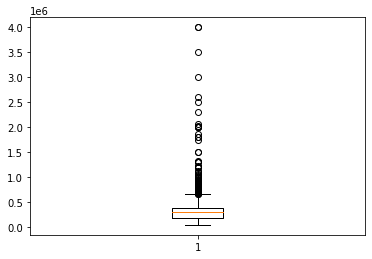

In [25]:
#The easiest way to take a look at the distribution of a numerical variable is to plot its histogram using the DataFrame's method hist().
import seaborn as sns
print("Mean ", df['Salary'].mean())
print("Median ", df['Salary'].median())
print("Minimum value ", df['Salary'].min())
print("Maximum value ", df['Salary'].max())

plt.boxplot(df['Salary'])
plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb3c774dbd0>,
      dtype=object)

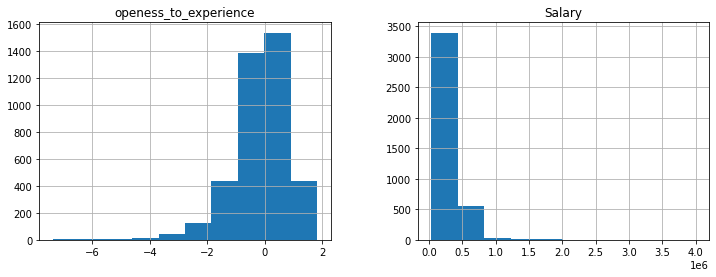

In [26]:
df[['openess_to_experience', 'Salary']].hist(figsize=(12,4))

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


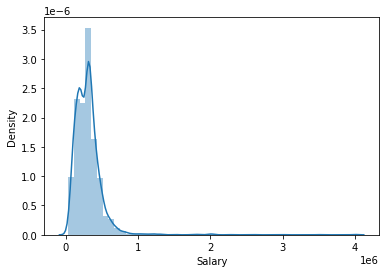

In [27]:
sns.distplot(df['Salary'])

In salary, we can see we have many values which are extremely high. These are called outliers. Boxplot helps to identify the outliers. And it also tells the mean, median, IQR. Salary > 10,00,000 is very rare, especially in the first job. So these are considered as outliers and should be removed.

In [28]:
# row in which value of 'salary less than certian amount
for i in range(1,8):
    sal_col = df.apply(lambda x: True if x['Salary'] <= 250000*i  else False , axis=1)
    # Count number of True in series
    numOfRows = len(sal_col[sal_col == True].index)
 
    print('Number of Rows in dataframe in which Salary %d  : '%((250000*i)), numOfRows)

Number of Rows in dataframe in which Salary 250000  :  1710
Number of Rows in dataframe in which Salary 500000  :  3683
Number of Rows in dataframe in which Salary 750000  :  3929
Number of Rows in dataframe in which Salary 1000000  :  3962
Number of Rows in dataframe in which Salary 1250000  :  3975
Number of Rows in dataframe in which Salary 1500000  :  3981
Number of Rows in dataframe in which Salary 1750000  :  3982


In [29]:
indexNames = df[ df['Salary'] > 1000000 ].index
# Delete these row indexes from dataFrame
df.drop(indexNames , inplace=True)
df.shape


(3962, 37)

**OBSERVATION:**  In the above plot, we see that the variable 'openess_to_experience'  is skewed right, while salary is prominently skewed left.

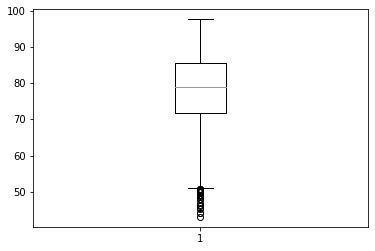

In [30]:
plt.boxplot(df['10percentage'])
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


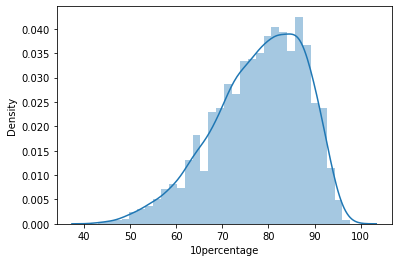

In [31]:
sns.distplot(df['10percentage'])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb3c73bb2d0>]],
      dtype=object)

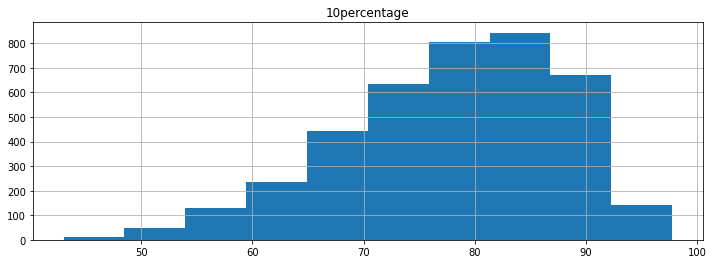

In [32]:
df[['10percentage']].hist(figsize=(12,4))

**Observation:** The 10percentage column is not normally distributed and is Right Skewed and the max is in range 75-90

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


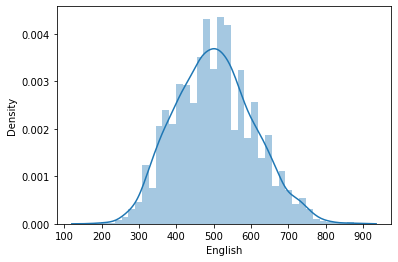

In [33]:
sns.distplot(df['English'])

**Observation: The English column is normally distributed and has max in range 400-600**

**2. Categorical Variables:**

In [34]:
df['Gender'].value_counts()

m    3012
f     950
Name: Gender, dtype: int64

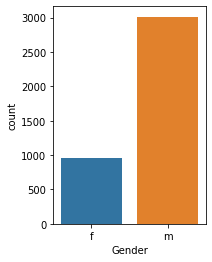

In [35]:
plt.subplots_adjust(hspace=0.4, wspace=0.2)

plt.subplot(121)
sns.countplot(x='Gender', data=df)

plt.show()

In [36]:
df['Specialization'].value_counts()

electronics and communication engineering      875
computer science & engineering                 739
information technology                         655
computer engineering                           592
computer application                           241
mechanical engineering                         197
electronics and electrical engineering         194
electronics & telecommunications               121
electrical engineering                          81
electronics & instrumentation eng               31
civil engineering                               29
information science engineering                 27
electronics and instrumentation engineering     26
instrumentation and control engineering         19
electronics engineering                         19
biotechnology                                   15
other                                           13
industrial & production engineering             10
chemical engineering                             9
applied electronics and instrum

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


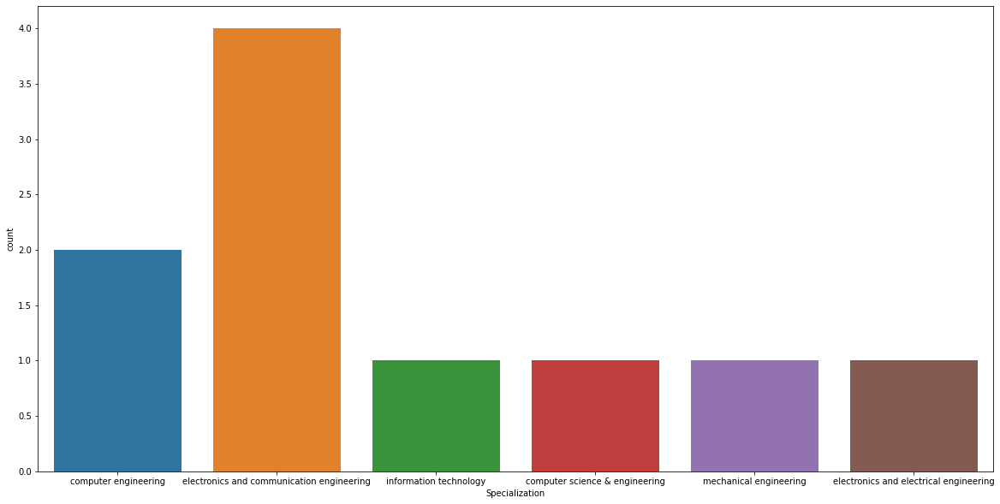

In [37]:
plt.figure(figsize=(20, 10))
data=df[:10]
sns.countplot(data['Specialization'])

**Observation: Electronics and communication engineering is the highest prefered Specialization**

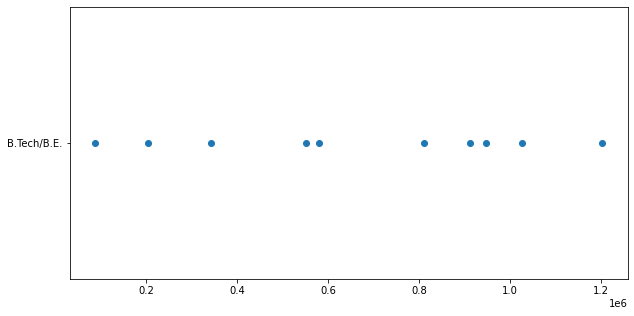

In [38]:
plt.figure(figsize=(10,5))
plt.scatter(data.index, data['Degree'])

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0, 0.5, 'fraction/percent')

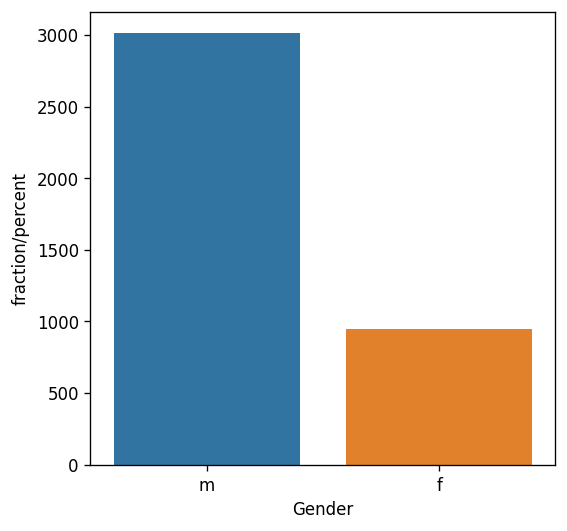

In [39]:
#Plotting "Gender"
plt.figure(figsize = (5,5), dpi = 120)
branch_count = df['Gender'].value_counts()
sns.barplot(branch_count.index, branch_count , order = branch_count.index)
plt.xlabel('Gender')
plt.ylabel('fraction/percent')
#plt.ylim(0,0.02)

**Male candidates are 2 times more than Female Candidates.**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0, 0.5, 'fraction/percent')

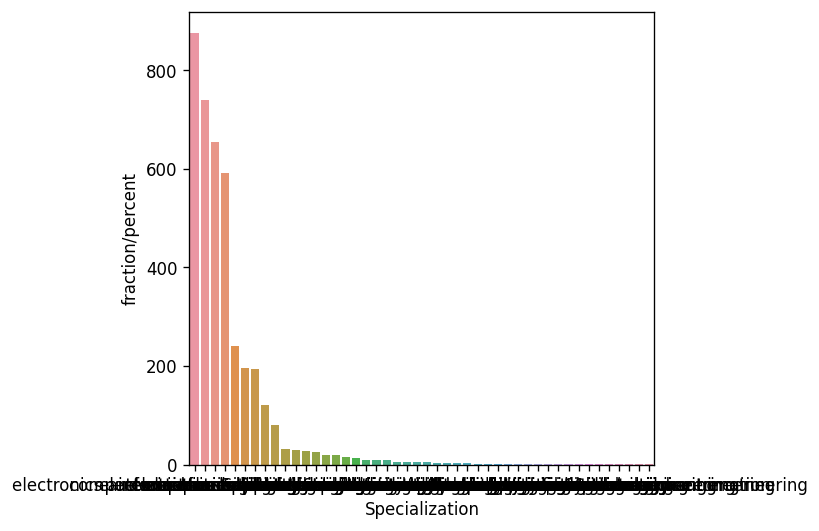

In [40]:
#Plotting "Specialization"
plt.figure(figsize = (5,5), dpi = 120)
branch_count = df['Specialization'].value_counts()
sns.barplot(branch_count.index, branch_count , order = branch_count.index)
plt.xlabel('Specialization')
plt.ylabel('fraction/percent')
#plt.ylim(0,0.02)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0, 0.5, 'fraction/percent')

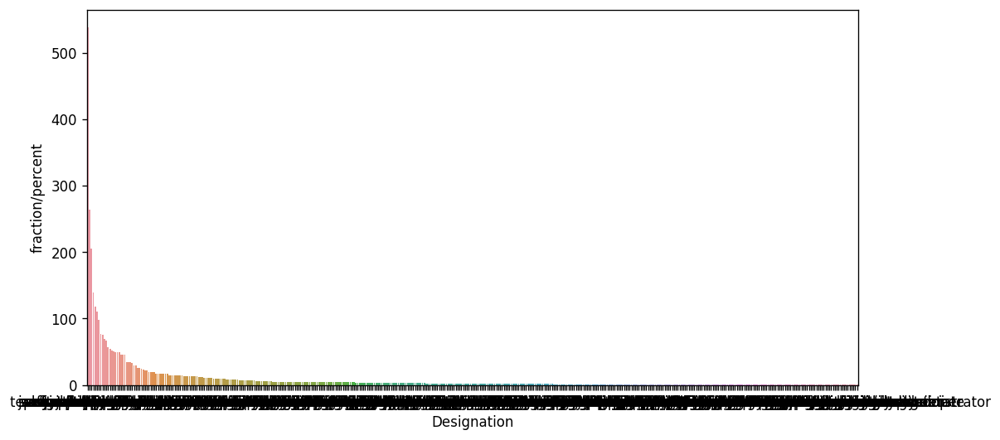

In [41]:
#Plotting "JobCity"
plt.figure(figsize = (10,5), dpi = 120)
branch_count = df['Designation'].value_counts()
sns.barplot(branch_count.index, branch_count , order = branch_count.index)
plt.xlabel('Designation')
plt.ylabel('fraction/percent')
#plt.ylim(0,0.02)

**Observation:For both variable "Designation" and "specialization", there are too many categories. There is clear relation that some specialization and designation are more opted with candidates and and this trend decreases rapidly.**

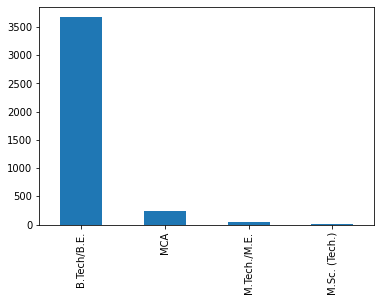

In [42]:
df['Degree'].value_counts().plot(kind='bar')

**Observation: This is clear that Majority of the candidates have Degree of BTech/B.E**

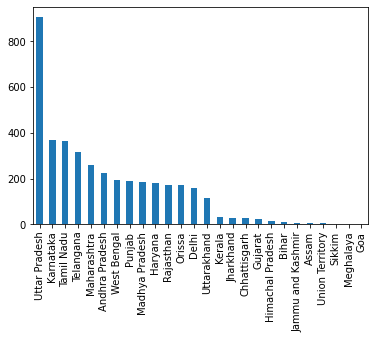

In [43]:
df['CollegeState'].value_counts().plot(kind='bar')

(array([0. , 0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5]),
 <a list of 8 Text major ticklabel objects>)

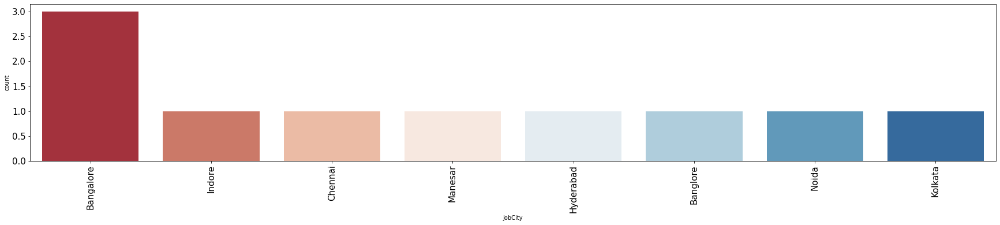

In [44]:
plt.figure(figsize=(30, 5))
sns.countplot(x='JobCity', data=data[:500], palette='RdBu')
plt.xticks(fontsize=15)
plt.xticks(rotation=90)
plt.yticks(fontsize=15)

**Observation: The majority of jobs are available in Banglore.**

## **Step 4:Bivariate Analysis:**
"Bi means two and variate means variable, so here there are two variables. The analysis is related to cause and the relationship between the two variables."

* This type of data involves two different variables. The analysis of this type of data deals with causes and relationships and the analysis is done to find out the relationship among the two variables.

* **Example:**          
Example of bivariate data can be temperature and ice cream sales in summer season.                
Suppose the temperature and ice cream sales are the two variables of a bivariate data. Here, the relationship is visible from the table that temperature and sales are directly proportional to each other and thus related because as the temperature increases, the sales also increase. Thus bivariate data analysis involves comparisons, relationships, causes and explanations. These variables are often plotted on X and Y axis on the graph for better understanding of data and one of these variables is independent while the other is dependent.

**There are three types of bivariate analysis.**

1. Bivariate Analysis of two Numerical Variables (Numerical-Numerical)
2. Bivariate Analysis of two categorical Variables (Categorical-Categorical)
3. Bivariate Analysis of one numerical and one categorical variable (Numerical-Categorical)

**1. Relationship between two numerical Variables:**

A scatter plot represents individual pieces of data using dots. These plots make it easier to see if two variables are related to each other. The resulting pattern indicates the type (linear or non-linear) and strength of the relationship between two variables.

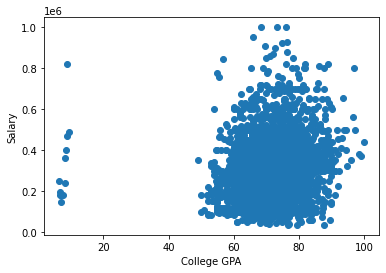

In [45]:
plt.scatter(x=df['collegeGPA'], y=df['Salary'])
plt.xlabel('College GPA')
plt.ylabel('Salary')
plt.show()

Linear Correlation represents the strength of a linear relationship between two numerical variables. If there is no correlation between the two variables, there is no tendency to change along with the values of the second quantity.

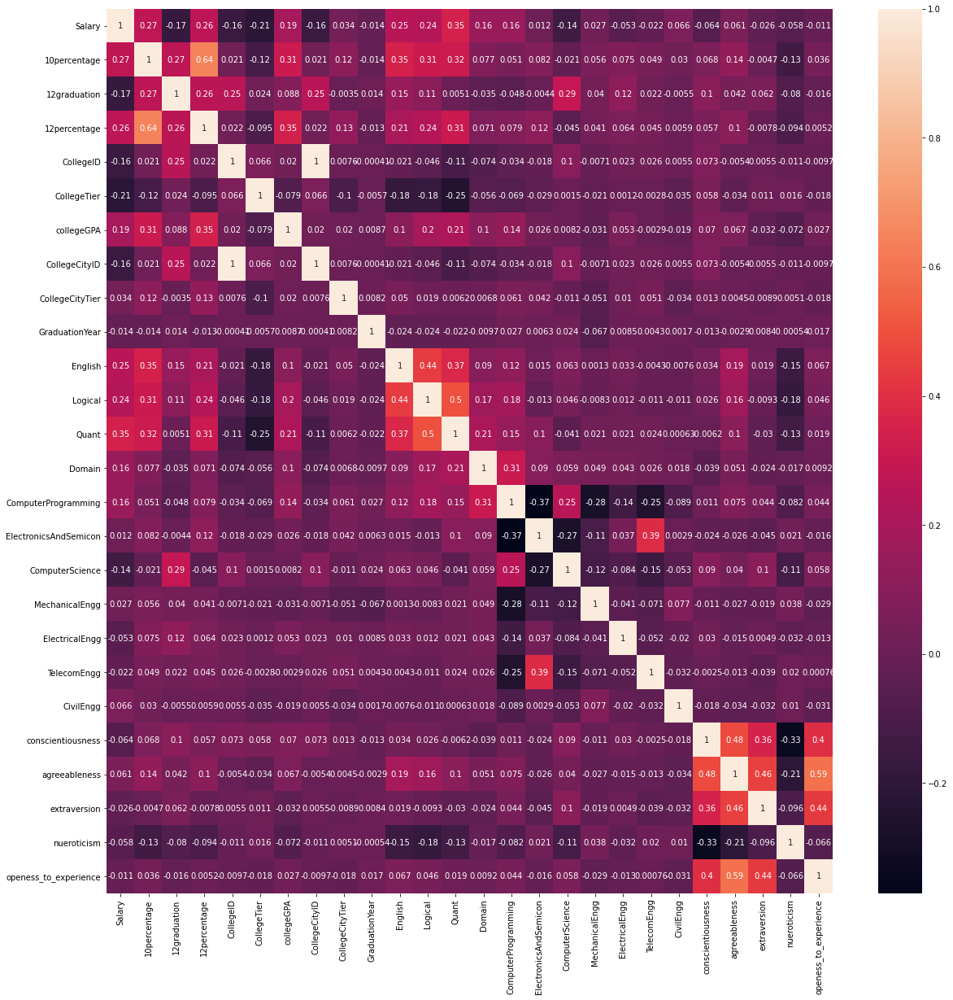

In [46]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(),annot=True)

(array([ 40.,  50.,  60.,  70.,  80.,  90., 100.]),
 <a list of 7 Text major ticklabel objects>)

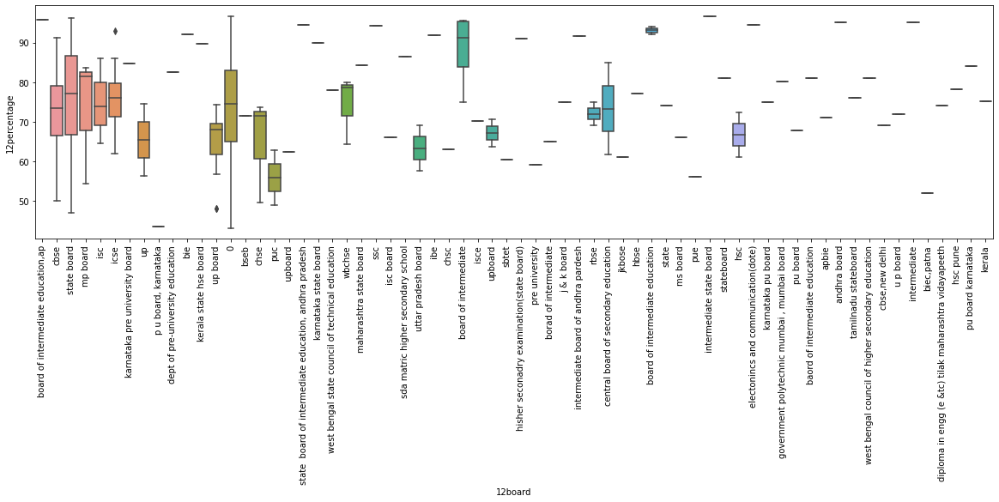

In [47]:
plt.figure(figsize=(20,5))
sns.boxplot(data = df[:500], x='12board', y='12percentage')
plt.xticks(fontsize=10)
plt.xticks(rotation=90)
plt.yticks(fontsize=10)

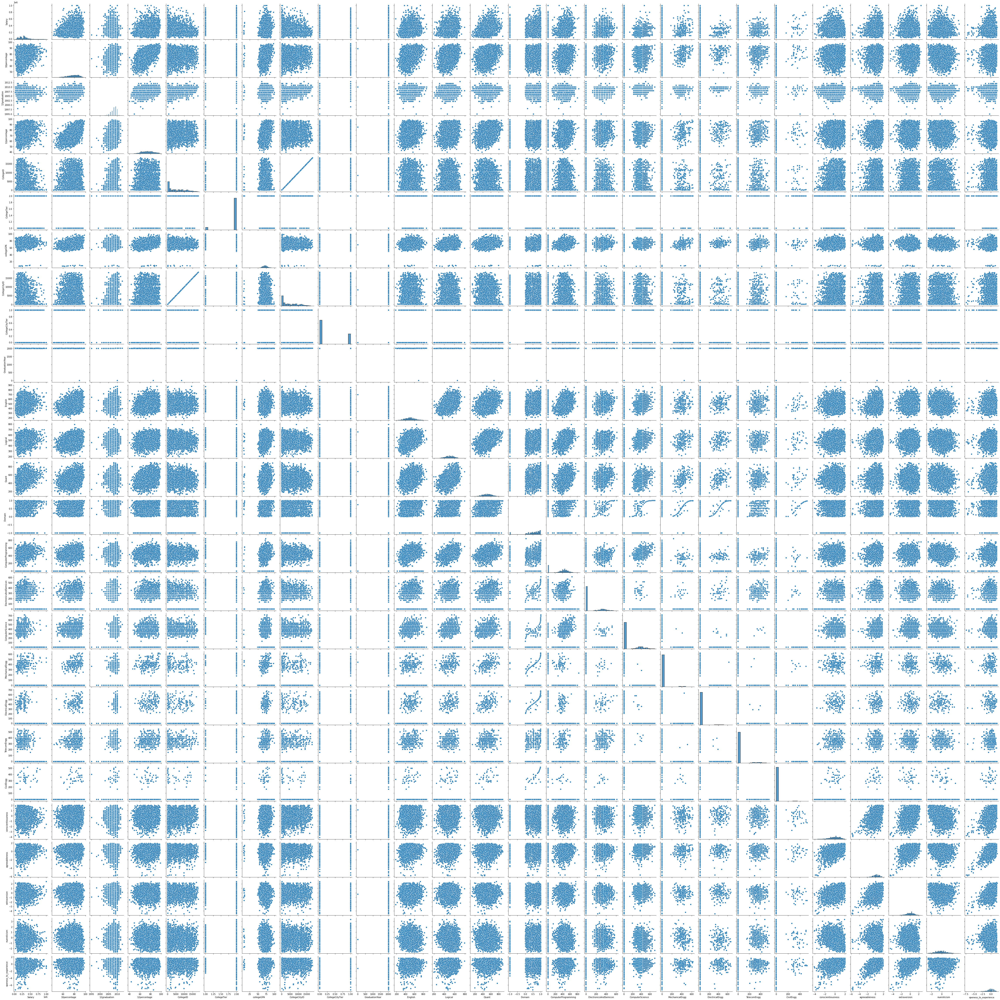

In [48]:
sns.pairplot(data = df)

**2. Relationship between Two categorical Variables:**

To find the relationship between two categorical variables, we can use following methods:
* **Two-way table:** We can start analysing the relationship by creating a two-way table of count and count%. The rows represent the category of one variable and the columns represent the categories of the other variable. It shows count or count% of observations available in each combination of row and column categories.                         
* **Stacked Column Chart:** This method is more of a visual form of a Two-way table.

In [49]:
# Cross tabulation between GENDER and Degree
CrosstabResult=pd.crosstab(index=df['Degree'],columns=df['Gender'])
print(CrosstabResult)

Gender           f     m
Degree                  
B.Tech/B.E.    884  2785
M.Sc. (Tech.)    1     1
M.Tech./M.E.     8    43
MCA             57   183


In [50]:
# importing the required function
from scipy.stats import chi2_contingency
 
# Performing Chi-sq test
ChiSqResult = chi2_contingency(CrosstabResult)
 
# P-Value is the Probability of H0 being True
# If P-Value>0.05 then only we Accept the assumption(H0)
 
print('The P-Value of the ChiSq Test is:', ChiSqResult[1])

The P-Value of the ChiSq Test is: 0.4401678438944787


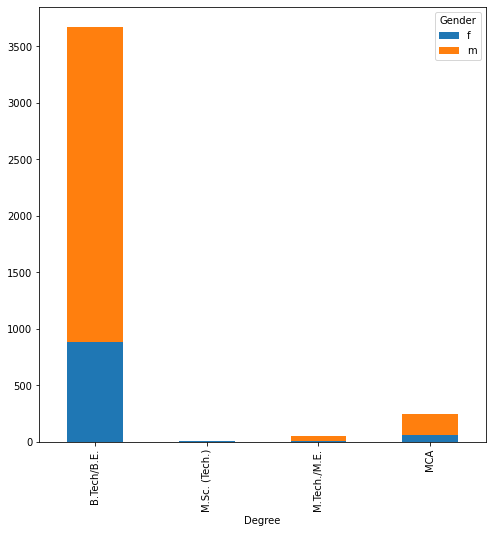

In [51]:
CrosstabResult.plot(kind="bar", 
                 figsize=(8,8),
                 stacked=True)

**3. Relationship between numerical and categorical data:**

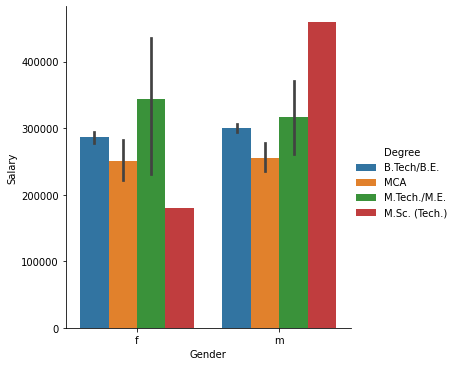

In [52]:
sns.catplot(x="Gender", y="Salary", hue="Degree", kind="bar", data=df)

**Observation: Males with M.Sc degree have highest salary.**

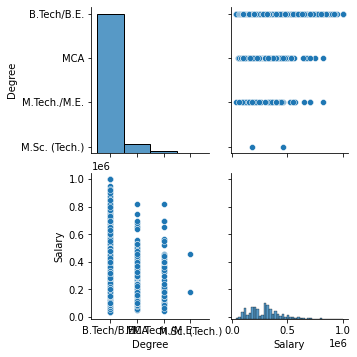

In [53]:
sns.pairplot(df,vars=['Degree', 'Salary']);

**Observation: Candidates with B.Tech degree have highest salary.**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


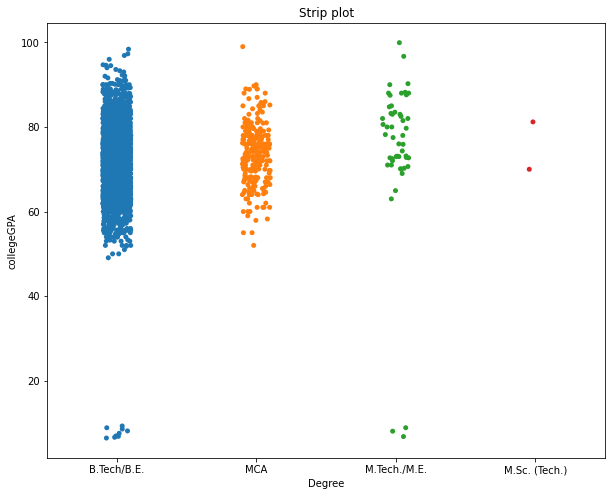

In [54]:
fig, ax= plt.subplots(figsize=(10, 8))  
sns.stripplot(df['Degree'], df['collegeGPA'], jitter=True, ax=ax)  
ax.set_title('Strip plot')  
plt.show()  

**Observations: Mostly candidates with degree B.E / B.Tech have high GPA**

Text(0, 0.5, 'Salary')

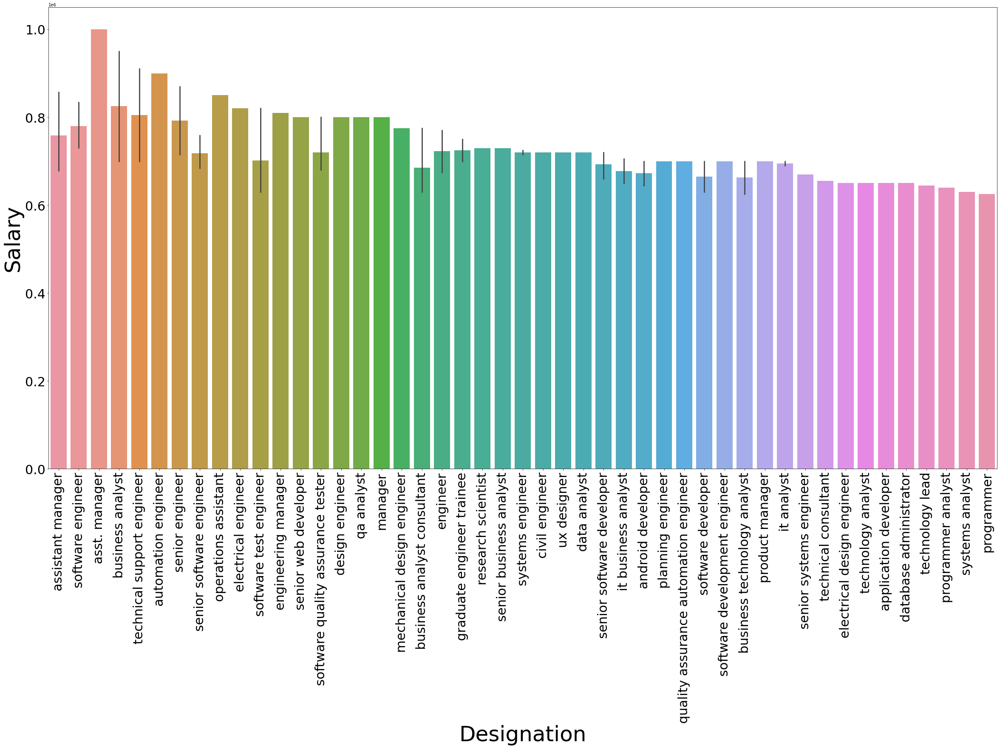

In [55]:
plt.figure(figsize=(40, 20))
data1 = df.sort_values(by=['Salary'], ascending=False)
sns.barplot(x='Designation', y='Salary', data=data1[:100])
plt.xticks(fontsize=30)
plt.xticks(rotation=90)
plt.yticks(fontsize=30)
plt.xlabel('Designation', fontsize= 50)
plt.ylabel('Salary', fontsize = 50)

**Observation: asst.manager has high salary**

##**Step - 5 - Research Questions**

Times of India article dated Jan 18, 2019 states that “After doing your Computer Science
Engineering if you take up jobs as a Programming Analyst, Software Engineer,
Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.” Test this claim with the data given to you.
- Is there a relationship between gender and specialisation? (i.e. Does the preference of
Specialisation depend on the Gender?)

In [56]:
dframes = pd.crosstab(df['Specialization'], df['Gender'], margins=True)
dframes

Gender,f,m,All
Specialization,,,
aeronautical engineering,1,2,3
applied electronics and instrumentation,2,7,9
automobile/automotive engineering,0,5,5
biomedical engineering,2,0,2
biotechnology,9,6,15
ceramic engineering,0,1,1
chemical engineering,1,8,9
civil engineering,6,23,29
computer and communication engineering,0,1,1


In [57]:
from scipy.stats import norm
# z_score for sampling distributions

def z_score(sample_size, sample_mean, pop_mean, pop_std):
    numerator = sample_mean - pop_mean
    denomenator = pop_std / sample_size**0.5
    return numerator / denomenator

In [58]:
confidence_level = 0.95
alpha = 1 - confidence_level
z_critical = norm.ppf(1 - alpha)
print(z_critical)

1.6448536269514722


In [59]:

sample_size = 100
sample_mean = 465
pop_mean = df['Salary'].mean()
pop_std = df['Salary'].std()
print(pop_mean)

294311.9636547198


In [60]:
# Calculating the z-score

z = z_score(sample_size, sample_mean, pop_mean, pop_std)
print(z)

-20.759272364266025


In [61]:
if(z > z_critical):
    print("Reject Null Hypothesis")
else:
    print("Fail to reject Null Hypothesis")

Fail to reject Null Hypothesis


In [62]:
p_value = 1.0 - norm.cdf(np.abs(z))

print("p_value = ", p_value)

if(p_value < alpha):
    print("Reject Null Hypothesis")
else:
    print("Fail to reject Null Hypothesis")

p_value =  0.0
Reject Null Hypothesis
